# **Plotly Well Log Plots**

Data visualization is a very import part of working with data and Python has many modules that allow us to display a wide range of charts.

**plotly express**: is a python module that caan create powerful interactive visualisations. We can create well log plots and control different features in it.

In [2]:
# importing modules:
import pandas as pd
import lasio

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots


In [3]:
# loading data and converting it to pandas df object
df = lasio.read('../Data/inputs/16_7-3.las').df()

In [12]:
df.head()

,index,DEPT,CALI,DRHO,NPHI,RHOB,GR,DTC,DTE,RDEP,SP,RSHA,RMED
0,0,105.125000,15.771,NaN,NaN,1.0,13.784,201.073471,61935360.0,1.341,20.712999,0.385,0.385
1,1,105.250000,15.771,NaN,NaN,1.0,13.784,201.074219,61935360.0,1.341,20.712999,0.385,0.385
2,2,105.375000,15.771,NaN,NaN,1.0,13.784,201.076233,61935360.0,1.341,20.712999,0.385,0.385
3,3,105.500008,15.771,NaN,NaN,1.0,13.784,201.076752,61935360.0,1.341,20.712999,0.385,0.385
4,4,105.624992,15.771,NaN,NaN,1.0,13.784,201.073242,61935360.0,1.341,20.712999,0.385,0.385


In [6]:
# resetting depth column index so that it can be used as colummn
df.reset_index(inplace=True)

In [19]:
# drop Lithology column
# df = df.drop(['LITHOLOGY_GEOLINK'], axis =1)
df = df.drop(['index'], axis =1)

In [20]:
df.describe()

,DEPT,CALI,DRHO,NPHI,RHOB,GR,DTC,DTE,RDEP,SP,RSHA,RMED
count,24318.000000,24269.000000,6965.000000,6965.000000,24234.000000,24318.000000,24198.000000,2.419800e+04,24318.000000,24318.000000,24318.000000,24318.000000
mean,1624.937500,12.749355,0.033771,0.208790,2.224134,61.052888,128.358353,3.872800e+07,218.108762,65.455980,2.029839,2.029839
std,877.518282,2.707768,0.184694,0.089473,0.208139,23.443571,34.943297,1.052535e+07,1450.116675,9.874364,1.856153,1.856153
min,105.125000,4.766000,-1.756000,0.001000,1.000000,-3.257000,46.650982,1.463081e+07,0.251000,1.812000,0.378000,0.378000
25%,865.031372,9.789000,0.002000,0.112130,2.104304,43.840250,92.344120,2.764444e+07,0.774000,59.448002,1.062000,1.062000
50%,1624.937561,12.978000,0.044000,0.244070,2.132534,64.307499,143.558334,4.276103e+07,1.327000,66.426502,1.455000,1.455000
75%,2384.843750,15.744000,0.103000,0.285730,2.409622,76.254997,150.235752,4.511742e+07,1.780000,73.405748,2.117750,2.117750
max,3144.749512,15.829000,0.292000,0.393920,2.976133,776.711975,201.085190,6.193536e+07,10000.000000,89.733002,18.068001,18.068001


<AxesSubplot:>

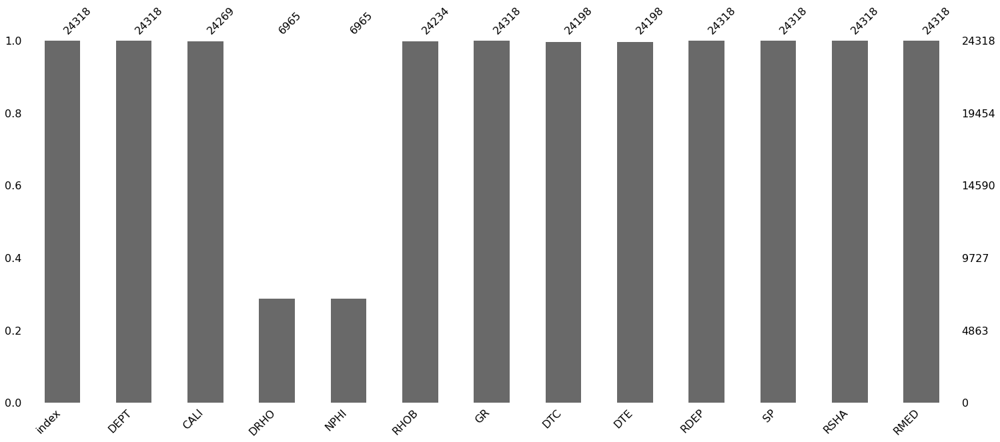

In [17]:
# viewing data missing status using 
import missingno as mn
mn.bar(df)

## **Plotly Graph Objects**

Low level interface for creating interactive figures, adding traces and creating layouts

In [22]:
fig = go.Figure(data = go.Scatter(y=df['DEPT'], x =df['GR']))
fig.update_layout(xaxis_title ='GR', yaxis_title='Depth')
fig.show()

## **Plotly Express**

A high level wrapper around plotly, that allows users to interact with plotly using easier syntax



In [24]:
fig = px.line(df, x='GR', y='DEPT')
fig.show()

In [28]:
# limiting ranges
fig = px.line(df, x='GR', y='DEPT', 
              range_y = [2500,3000],
              range_x = [0,150])

fig.show()

In [30]:
# adding slider
fig = px.line(df, y='GR', x='DEPT', 
              range_x = [2500,3000],
              range_y = [0,150])
fig.update_xaxes(rangeslider_visible=True)
fig.show()

## **Log Plots with** *make_subplots()*

In [31]:
fig = make_subplots(rows = 1, cols= 3)
fig.add_trace(go.Scatter(x=df['GR'], y=df['DEPT']), row=1, col=1)
fig.add_trace(go.Scatter(x=df['NPHI'], y=df['DEPT']), row=1, col=2)
fig.add_trace(go.Scatter(x=df['RHOB'], y=df['DEPT']), row=1, col=3)
fig.show()

In [32]:
# shared depth column so that at the same time we can see same depth range all three curves
fig = make_subplots(rows = 1, cols= 3, shared_yaxes=True)
fig.add_trace(go.Scatter(x=df['GR'], y=df['DEPT']), row=1, col=1)
fig.add_trace(go.Scatter(x=df['NPHI'], y=df['DEPT']), row=1, col=2)
fig.add_trace(go.Scatter(x=df['RHOB'], y=df['DEPT']), row=1, col=3)
fig.show()

In [33]:
# tidying up plots to make it cleaner and better
fig = make_subplots(rows = 1, cols= 3, shared_yaxes=True)
fig.add_trace(go.Scatter(x=df['GR'], y=df['DEPT']), row=1, col=1)
fig.add_trace(go.Scatter(x=df['NPHI'], y=df['DEPT']), row=1, col=2)
fig.add_trace(go.Scatter(x=df['RHOB'], y=df['DEPT']), row=1, col=3)

fig.update_xaxes(title_text='GR', row=1,col=1)
fig.update_xaxes(title_text='NPHI', row=1,col=2)
fig.update_xaxes(title_text='RHOB', row=1,col=3)

fig.update_yaxes(title_text='DEPTH', row=1,col=1, autorange='reversed')
fig.show()

In [35]:


fig = make_subplots(rows = 1, cols= 3, shared_yaxes=True)
fig.add_trace(go.Scatter(x=df['GR'], y=df['DEPT']), row=1, col=1)
fig.add_trace(go.Scatter(x=df['NPHI'], y=df['DEPT']), row=1, col=2)
fig.add_trace(go.Scatter(x=df['RHOB'], y=df['DEPT']), row=1, col=3)

fig.update_xaxes(title_text='GR', row=1,col=1)
fig.update_xaxes(title_text='NPHI', row=1,col=2)
fig.update_xaxes(title_text='RHOB', row=1,col=3)

fig.update_yaxes(title_text='DEPTH', row=1,col=1, autorange='reversed')
fig.update_layout(title_text=' Well LOG Plots', height=900)
fig.show()

##  Summary:

Here I have explored how plotly, plot subplots and plotly Graph plot is used to plot Well log data in to interactive plots.

Author:\
Dilshad Raza\
30/07/2022